# Classical correlation analysis for ibmq_bogota
We use the ibmq_bogota quantum computer to obtain IQ (in-phase and quadrature) signal data from applying pulses that drive the 0 and 1 qubits to the |0> and |1> states. We analyze pearson coefficients between arrays of signal data retrieved from |00>, |01>, |10> and |11> state schedules in the form $ r_j(ES_{i,X}, GS_{i,Y}) $ where $ X,Y \in \{I,Q\} $ and qubit $ i $ is in state $ j \in \{0,1\} $ when the other qubit is in the excited state ($ ES $) and ground state ($ GS $).

In [1]:
import sys
sys.path.append("..")

import mglearn
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

# Qubits 0 and 1

## Dataset retrieval
We first obtain the .csv files with the IQ signal data from applying each combination of the arrays to be used as input for the pearson correlation coefficients. We also plot the data to check if they are as expected.

In [2]:
data_00_0 = pd.read_csv('data/dataset_bogota_0_1_00_0.csv')[['x_1','x_2','y']]
data_00_1 = pd.read_csv('data/dataset_bogota_0_1_00_1.csv')[['x_1','x_2','y']]
data_01_0 = pd.read_csv('data/dataset_bogota_0_1_01_0.csv')[['x_1','x_2','y']]
data_01_1 = pd.read_csv('data/dataset_bogota_0_1_01_1.csv')[['x_1','x_2','y']]
data_10_0 = pd.read_csv('data/dataset_bogota_0_1_10_0.csv')[['x_1','x_2','y']]
data_10_1 = pd.read_csv('data/dataset_bogota_0_1_10_1.csv')[['x_1','x_2','y']]
data_11_0 = pd.read_csv('data/dataset_bogota_0_1_11_0.csv')[['x_1','x_2','y']]
data_11_1 = pd.read_csv('data/dataset_bogota_0_1_11_1.csv')[['x_1','x_2','y']]

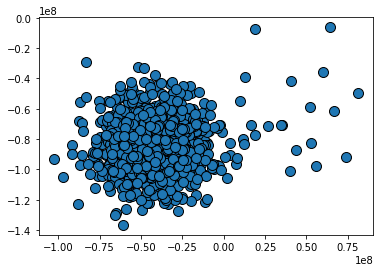

In [3]:
X = data_00_0
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

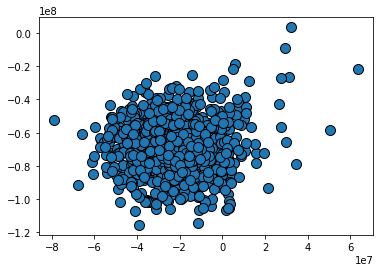

In [4]:
X = data_00_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

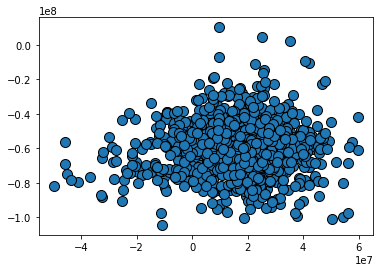

In [5]:
X = data_11_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

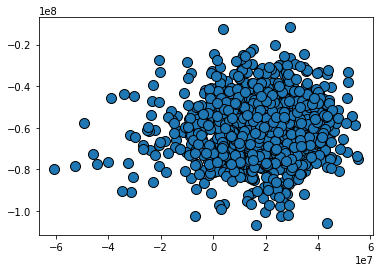

In [6]:
X = data_01_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

## Pearson correlation coefficients
We now make pairplots of the data points and find pearson correlation coefficients for all the arrays retrieved from the dataset preparation, resulting in a heatmap and several specific correlation coefficients of interest.

In [7]:
data_00_0_x1 = pd.DataFrame(data_00_0['x_1'])
data_00_0_x2 = pd.DataFrame(data_00_0['x_2'])
data_00_1_x1 = pd.DataFrame(data_00_1['x_1'])
data_00_1_x2 = pd.DataFrame(data_00_1['x_2'])
data_01_0_x1 = pd.DataFrame(data_01_0['x_1'])
data_01_0_x2 = pd.DataFrame(data_01_0['x_2'])
data_01_1_x1 = pd.DataFrame(data_01_1['x_1'])
data_01_1_x2 = pd.DataFrame(data_01_1['x_2'])
data_10_0_x1 = pd.DataFrame(data_10_0['x_1'])
data_10_0_x2 = pd.DataFrame(data_10_0['x_2'])
data_10_1_x1 = pd.DataFrame(data_10_1['x_1'])
data_10_1_x2 = pd.DataFrame(data_10_1['x_2'])
data_11_0_x1 = pd.DataFrame(data_11_0['x_1'])
data_11_0_x2 = pd.DataFrame(data_11_0['x_2'])
data_11_1_x1 =  pd.DataFrame(data_11_1['x_1'])
data_11_1_x2 =  pd.DataFrame(data_11_1['x_2'])
total_df = pd.concat((data_00_0_x1, data_00_0_x2, \
                      data_00_1_x1, data_00_1_x2, \
                      data_01_0_x1, data_01_0_x2, \
                      data_01_1_x1, data_01_1_x2, \
                      data_10_0_x1, data_10_0_x2, \
                      data_10_1_x1, data_10_1_x2, \
                      data_11_0_x1, data_11_0_x2, \
                      data_11_1_x1, data_11_1_x2), axis=1)
total_df.columns = ['|00>_q0_re', '|00>_q0_im', \
                      '|00>_q1_re', '|00>_q1_im', \
                      '|01>_q0_re', '|01>_q0_im', \
                      '|01>_q1_re', '|01>_q1_im', \
                      '|10>_q0_re', '|10>_q0_im', \
                      '|10>_q1_re', '|10>_q1_im', \
                      '|11>_q0_re', '|11>_q0_im', \
                      '|11>_q1_re', '|11>_q1_im']

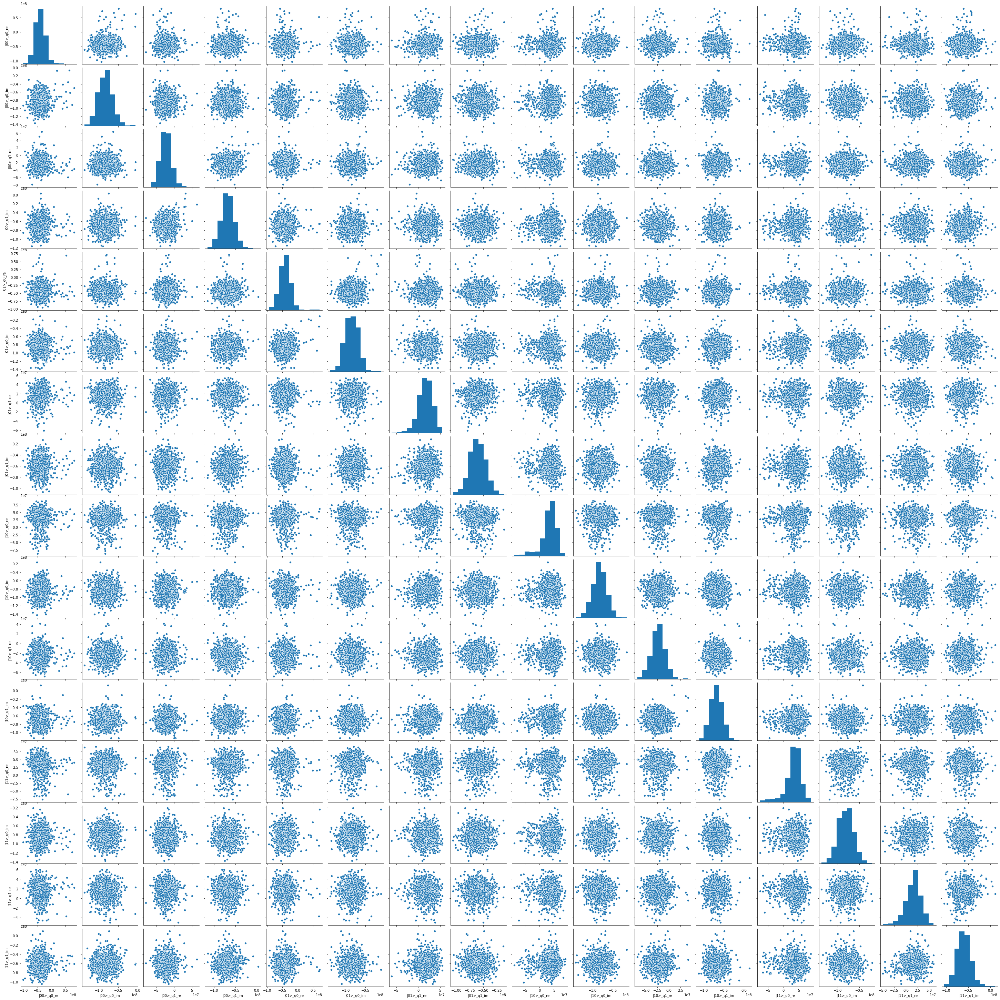

In [8]:
sns.pairplot(total_df)

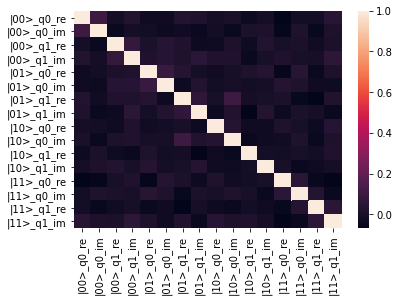

In [9]:
pd_corr = total_df.corr()
sns.heatmap(pd_corr)

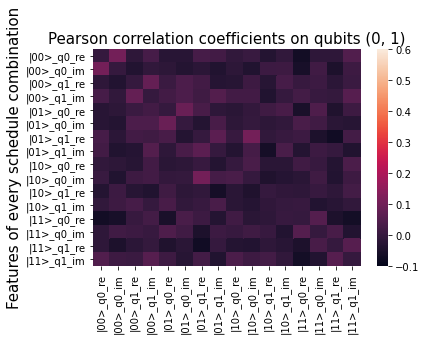

In [10]:
pd_corr = pd.DataFrame(pd_corr.to_numpy()-np.identity(pd_corr.to_numpy().shape[0]), columns=pd_corr.columns, index=pd_corr.index)
heatmap_0_1 = sns.heatmap(pd_corr,vmin = -0.1,vmax = 0.6)
fig = heatmap_0_1.get_figure()
plt.ylabel("Features of every schedule combination", fontsize=15)
plt.title("Pearson correlation coefficients on qubits (0, 1)", fontsize=15)
fig.savefig("heatmap_0_1.png", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_0_1.pdf", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_0_1.svg", transparent = True, bbox_inches = 'tight', pad_inches = 0)

In [11]:
np.corrcoef([data_00_0.values[:,0], data_01_0.values[:,1]])

array([[ 1.        , -0.02361538],
       [-0.02361538,  1.        ]])

In [12]:
np.corrcoef([data_00_0.values[:,1], data_01_0.values[:,0]])

array([[ 1.        , -0.01612502],
       [-0.01612502,  1.        ]])

In [13]:
np.corrcoef([data_10_0.values[:,0], data_11_0.values[:,1]])

array([[1.        , 0.00169444],
       [0.00169444, 1.        ]])

In [14]:
np.corrcoef([data_10_0.values[:,1], data_11_0.values[:,0]])

array([[ 1.        , -0.02105019],
       [-0.02105019,  1.        ]])

In [15]:
np.corrcoef([data_00_1.values[:,0], data_10_1.values[:,1]])

array([[1.        , 0.03111457],
       [0.03111457, 1.        ]])

In [16]:
np.corrcoef([data_00_1.values[:,1], data_10_1.values[:,0]])

array([[ 1.        , -0.03941538],
       [-0.03941538,  1.        ]])

In [17]:
np.corrcoef([data_01_1.values[:,0], data_11_1.values[:,1]])

array([[1.        , 0.02562397],
       [0.02562397, 1.        ]])

In [18]:
np.corrcoef([data_01_1.values[:,1], data_11_1.values[:,0]])

array([[ 1.        , -0.00121697],
       [-0.00121697,  1.        ]])

## Classical model training
The next step is training classical ML model instances for a set of prepared schedules. Two models are trained for each qubit in a qubit coupling, these being |0> and |1> (|00> and |01>) for the 0 qubit, |00>, |01>, |10> and |11> for the 0 qubit, |0> and |1> (|00> and |10>) for the 1 qubit, and |00>, |01>, |10> and |11> for the 1 qubit. These represent the 0_single, 0_both, 1_single and 1_both, respectively.

In [19]:
from numpy.linalg import norm
def assignment_fidelity(estimator, X, y):
    y_pred = estimator.predict(X)
    X_0 = X[y==0].mean(axis=0)
    X_0_pred = X[y_pred==0].mean(axis=0)
    X_1_pred = X[y_pred==1].mean(axis=0)
    if norm(X_0-X_0_pred) > norm(X_0-X_1_pred): return 1- np.sum(y==y_pred)/(2*y_pred.size)
    else: return 1- np.sum(y!=y_pred)/(2*y_pred.size)

In [20]:
def report_cv_score(z):
  print('Test score %.3f (±%.4f) with %d splits'%(np.mean(z['test_score']), np.std(z['test_score']), len(z['test_score'])))
  print('Train score %.3f (±%.4f) with %d splits'%(np.mean(z['train_score']), np.std(z['train_score']), len(z['train_score'])))

### Fowlkes Mallows Score

In [21]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.890 (±0.0246) with 10 splits
Train score 0.889 (±0.0021) with 10 splits


In [22]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.896 (±0.0151) with 10 splits
Train score 0.896 (±0.0017) with 10 splits


In [23]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.815 (±0.0352) with 10 splits
Train score 0.820 (±0.0040) with 10 splits


In [24]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.825 (±0.0182) with 10 splits
Train score 0.823 (±0.0020) with 10 splits


### Assignment Fidelity

In [25]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.970 (±0.0054) with 10 splits
Train score 0.970 (±0.0005) with 10 splits


In [26]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.973 (±0.0047) with 10 splits
Train score 0.972 (±0.0006) with 10 splits


In [27]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.951 (±0.0123) with 10 splits
Train score 0.950 (±0.0014) with 10 splits


In [28]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.949 (±0.0064) with 10 splits
Train score 0.951 (±0.0007) with 10 splits


## Classical cross validation correlation analysis

Here we sort assignment fidelities from all four trained classical ML models to observe the differences between scores obtained from qubits trained with single schedules (|00> and |01> with the 0 qubit as the least significant bit) and both schedules (|00>, |01>, |10> and |11>)

### Folkes Mallows train scores

|        | Q0            | Q1            |
|--------|---------------|---------------|
| Single | 0.889 ±0.0020 | 0.818 ±0.0032 |
| Both   | 0.897 ±0.0022 | 0.823 ±0.0028 |

### Folkes Mallows test scores

|        | Q0            | Q1            |
|--------|---------------|---------------|
| Single | 0.881 ±0.0173 | 0.825 ±0.0278 |
| Both   | 0.889 ±0.0175 | 0.828 ±0.0255 |

### Assignment fidelity train scores

|        | Q0            | Q1            |
|--------|---------------|---------------|
| Single | 0.970 ±0.0005 | 0.950 ±0.0014 |
| Both   | 0.972 ±0.0006 | 0.951 ±0.0007 |

### Assignment fidelity test scores

|        | Q0            | Q1            |
|--------|---------------|---------------|
| Single | 0.970 ±0.0054 | 0.951 ±0.0123 |
| Both   | 0.973 ±0.0047 | 0.949 ±0.0064 |

# Qubits 1 and 2

## Dataset retrieval
We first obtain the .csv files with the IQ signal data from applying each combination of the arrays to be used as input for the pearson correlation coefficients. We also plot the data to check if they are as expected.

In [29]:
data_00_0 = pd.read_csv('data/dataset_bogota_1_2_00_0.csv')[['x_1','x_2','y']]
data_00_1 = pd.read_csv('data/dataset_bogota_1_2_00_1.csv')[['x_1','x_2','y']]
data_01_0 = pd.read_csv('data/dataset_bogota_1_2_01_0.csv')[['x_1','x_2','y']]
data_01_1 = pd.read_csv('data/dataset_bogota_1_2_01_1.csv')[['x_1','x_2','y']]
data_10_0 = pd.read_csv('data/dataset_bogota_1_2_10_0.csv')[['x_1','x_2','y']]
data_10_1 = pd.read_csv('data/dataset_bogota_1_2_10_1.csv')[['x_1','x_2','y']]
data_11_0 = pd.read_csv('data/dataset_bogota_1_2_11_0.csv')[['x_1','x_2','y']]
data_11_1 = pd.read_csv('data/dataset_bogota_1_2_11_1.csv')[['x_1','x_2','y']]

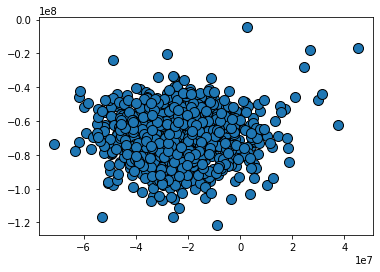

In [30]:
X = data_00_0
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

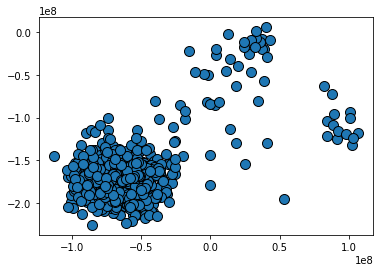

In [31]:
X = data_00_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

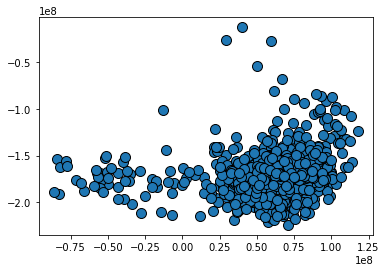

In [32]:
X = data_11_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

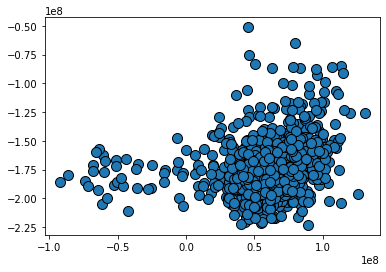

In [33]:
X = data_01_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

## Pearson correlation coefficients
We now make pairplots of the data points and find pearson correlation coefficients for all the arrays retrieved from the dataset preparation, resulting in a heatmap and several specific correlation coefficients of interest.

In [34]:
data_00_0_x1 = pd.DataFrame(data_00_0['x_1'])
data_00_0_x2 = pd.DataFrame(data_00_0['x_2'])
data_00_1_x1 = pd.DataFrame(data_00_1['x_1'])
data_00_1_x2 = pd.DataFrame(data_00_1['x_2'])
data_01_0_x1 = pd.DataFrame(data_01_0['x_1'])
data_01_0_x2 = pd.DataFrame(data_01_0['x_2'])
data_01_1_x1 = pd.DataFrame(data_01_1['x_1'])
data_01_1_x2 = pd.DataFrame(data_01_1['x_2'])
data_10_0_x1 = pd.DataFrame(data_10_0['x_1'])
data_10_0_x2 = pd.DataFrame(data_10_0['x_2'])
data_10_1_x1 = pd.DataFrame(data_10_1['x_1'])
data_10_1_x2 = pd.DataFrame(data_10_1['x_2'])
data_11_0_x1 = pd.DataFrame(data_11_0['x_1'])
data_11_0_x2 = pd.DataFrame(data_11_0['x_2'])
data_11_1_x1 =  pd.DataFrame(data_11_1['x_1'])
data_11_1_x2 =  pd.DataFrame(data_11_1['x_2'])
total_df = pd.concat((data_00_0_x1, data_00_0_x2, \
                      data_00_1_x1, data_00_1_x2, \
                      data_01_0_x1, data_01_0_x2, \
                      data_01_1_x1, data_01_1_x2, \
                      data_10_0_x1, data_10_0_x2, \
                      data_10_1_x1, data_10_1_x2, \
                      data_11_0_x1, data_11_0_x2, \
                      data_11_1_x1, data_11_1_x2), axis=1)
total_df.columns = ['|00>_q0_re', '|00>_q0_im', \
                      '|00>_q1_re', '|00>_q1_im', \
                      '|01>_q0_re', '|01>_q0_im', \
                      '|01>_q1_re', '|01>_q1_im', \
                      '|10>_q0_re', '|10>_q0_im', \
                      '|10>_q1_re', '|10>_q1_im', \
                      '|11>_q0_re', '|11>_q0_im', \
                      '|11>_q1_re', '|11>_q1_im']

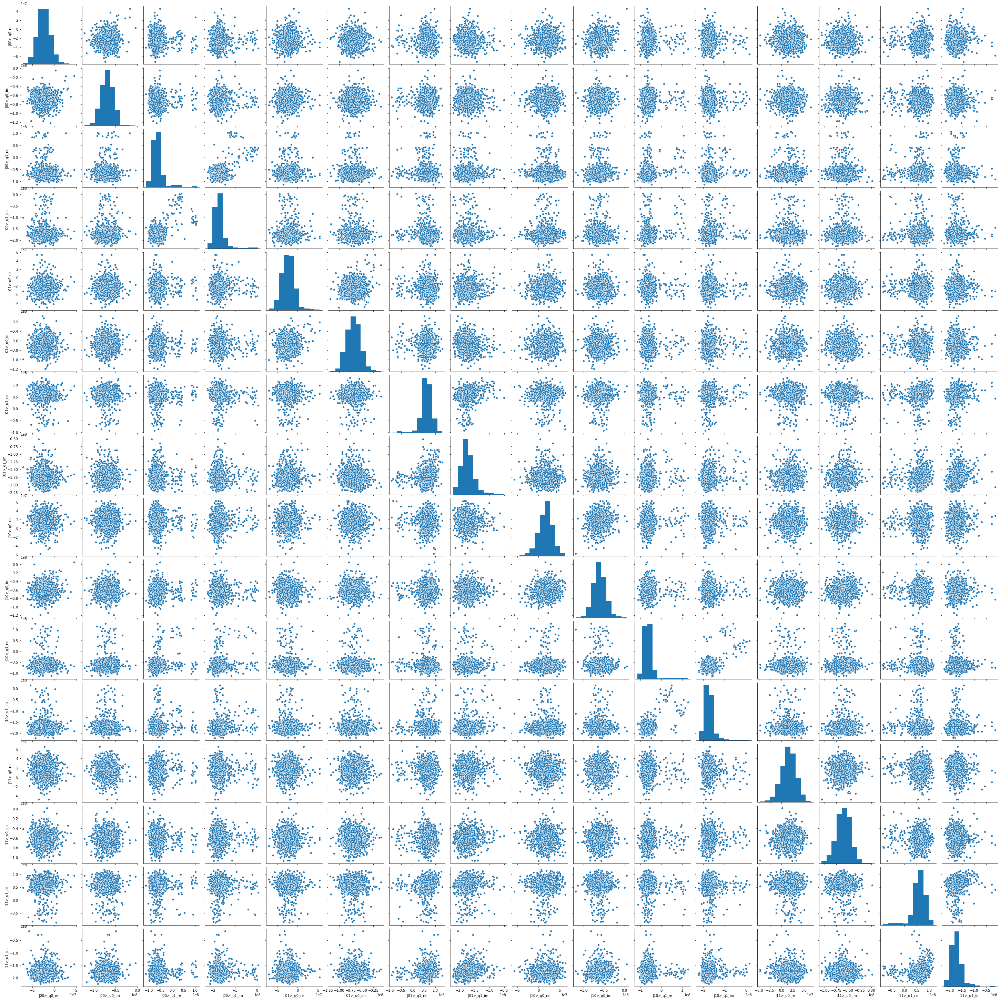

In [35]:
sns.pairplot(total_df)

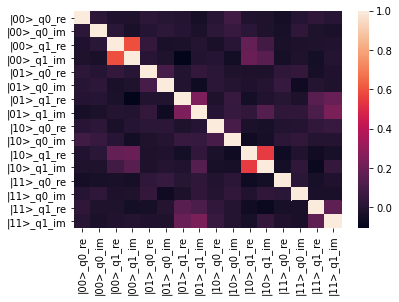

In [36]:
pd_corr = total_df.corr()
sns.heatmap(pd_corr)

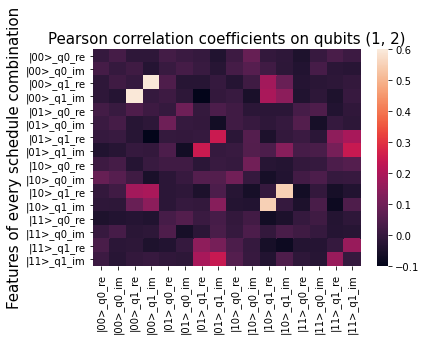

In [37]:
pd_corr = pd.DataFrame(pd_corr.to_numpy()-np.identity(pd_corr.to_numpy().shape[0]), columns=pd_corr.columns, index=pd_corr.index)
heatmap_1_2 = sns.heatmap(pd_corr,vmin = -0.1,vmax = 0.6)
fig = heatmap_1_2.get_figure()
plt.ylabel("Features of every schedule combination", fontsize=15)
plt.title("Pearson correlation coefficients on qubits (1, 2)", fontsize=15)
fig.savefig("heatmap_1_2.png", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_1_2.pdf", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_1_2.svg", transparent = True, bbox_inches = 'tight', pad_inches = 0)

In [38]:
np.corrcoef([data_00_0.values[:,0], data_01_0.values[:,1]])

array([[1.        , 0.00697089],
       [0.00697089, 1.        ]])

In [39]:
np.corrcoef([data_00_0.values[:,1], data_01_0.values[:,0]])

array([[1.       , 0.0062647],
       [0.0062647, 1.       ]])

In [40]:
np.corrcoef([data_10_0.values[:,0], data_11_0.values[:,1]])

array([[1.       , 0.0010731],
       [0.0010731, 1.       ]])

In [41]:
np.corrcoef([data_10_0.values[:,1], data_11_0.values[:,0]])

array([[1.        , 0.02139981],
       [0.02139981, 1.        ]])

In [42]:
np.corrcoef([data_00_1.values[:,0], data_10_1.values[:,1]])

array([[1.        , 0.08687128],
       [0.08687128, 1.        ]])

In [43]:
np.corrcoef([data_00_1.values[:,1], data_10_1.values[:,0]])

array([[1.        , 0.19267427],
       [0.19267427, 1.        ]])

In [44]:
np.corrcoef([data_01_1.values[:,0], data_11_1.values[:,1]])

array([[1.        , 0.19225415],
       [0.19225415, 1.        ]])

In [45]:
np.corrcoef([data_01_1.values[:,1], data_11_1.values[:,0]])

array([[1.        , 0.11110513],
       [0.11110513, 1.        ]])

## Classical model training
The next step is training classical ML model instances for a set of prepared schedules. Two models are trained for each qubit in a qubit coupling, these being |0> and |1> (|00> and |01>) for the 0 qubit, |00>, |01>, |10> and |11> for the 0 qubit, |0> and |1> (|00> and |10>) for the 1 qubit, and |00>, |01>, |10> and |11> for the 1 qubit. These represent the 0_single, 0_both, 1_single and 1_both, respectively.

### Fowlkes Mallows Score

In [46]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.810 (±0.0278) with 10 splits
Train score 0.825 (±0.0031) with 10 splits


In [47]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.822 (±0.0204) with 10 splits
Train score 0.827 (±0.0023) with 10 splits


In [48]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.917 (±0.0193) with 10 splits
Train score 0.917 (±0.0021) with 10 splits


In [49]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.911 (±0.0188) with 10 splits
Train score 0.916 (±0.0021) with 10 splits


### Assignment Fidelity

In [50]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.949 (±0.0071) with 10 splits
Train score 0.951 (±0.0007) with 10 splits


In [51]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.954 (±0.0067) with 10 splits
Train score 0.952 (±0.0008) with 10 splits


In [52]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.976 (±0.0071) with 10 splits
Train score 0.979 (±0.0008) with 10 splits


In [53]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.977 (±0.0059) with 10 splits
Train score 0.978 (±0.0007) with 10 splits


## Classical cross validation correlation analysis

Here we sort assignment fidelities from all four trained classical ML models to observe the differences between scores obtained from qubits trained with single schedules (|00> and |01> with the 0 qubit as the least significant bit) and both schedules (|00>, |01>, |10> and |11>)

### Folkes Mallows train scores

|        | Q1            | Q2            |
|--------|---------------|---------------|
| Single | 0.825 ±0.0031 | 0.917 ±0.0021 |
| Both   | 0.827 ±0.0023 | 0.916 ±0.0021 |

### Folkes Mallows test scores

|        | Q1            | Q2            |
|--------|---------------|---------------|
| Single | 0.810 ±0.0278 | 0.917 ±0.0193 |
| Both   | 0.822 ±0.0204 | 0.911 ±0.0188 |

### Assignment fidelity train scores

|        | Q1            | Q2            |
|--------|---------------|---------------|
| Single | 0.951 ±0.0007 | 0.979 ±0.0008 |
| Both   | 0.952 ±0.0008 | 0.978 ±0.0007 |

### Assignment fidelity test scores

|        | Q1            | Q2            |
|--------|---------------|---------------|
| Single | 0.949 ±0.0071 | 0.976 ±0.0071 |
| Both   | 0.954 ±0.0067 | 0.977 ±0.0059 |

# Qubits 2 and 3

## Dataset retrieval
We first obtain the .csv files with the IQ signal data from applying each combination of the arrays to be used as input for the pearson correlation coefficients. We also plot the data to check if they are as expected.

In [54]:
data_00_0 = pd.read_csv('data/dataset_bogota_2_3_00_0.csv')[['x_1','x_2','y']]
data_00_1 = pd.read_csv('data/dataset_bogota_2_3_00_1.csv')[['x_1','x_2','y']]
data_01_0 = pd.read_csv('data/dataset_bogota_2_3_01_0.csv')[['x_1','x_2','y']]
data_01_1 = pd.read_csv('data/dataset_bogota_2_3_01_1.csv')[['x_1','x_2','y']]
data_10_0 = pd.read_csv('data/dataset_bogota_2_3_10_0.csv')[['x_1','x_2','y']]
data_10_1 = pd.read_csv('data/dataset_bogota_2_3_10_1.csv')[['x_1','x_2','y']]
data_11_0 = pd.read_csv('data/dataset_bogota_2_3_11_0.csv')[['x_1','x_2','y']]
data_11_1 = pd.read_csv('data/dataset_bogota_2_3_11_1.csv')[['x_1','x_2','y']]

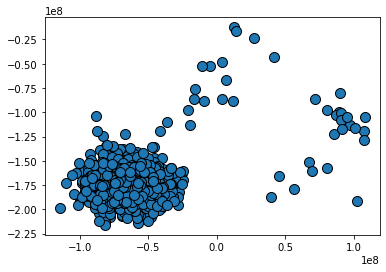

In [55]:
X = data_00_0
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

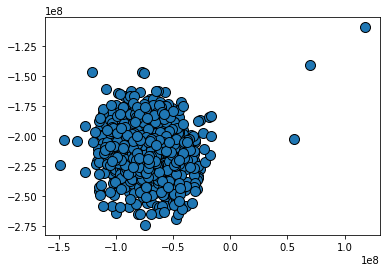

In [56]:
X = data_00_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

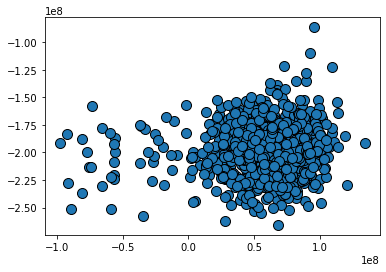

In [57]:
X = data_11_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

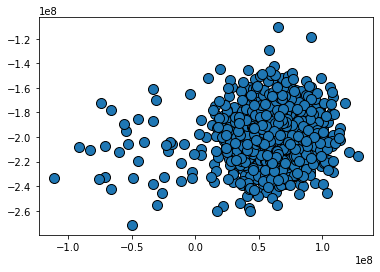

In [58]:
X = data_01_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

## Pearson correlation coefficients
We now make pairplots of the data points and find pearson correlation coefficients for all the arrays retrieved from the dataset preparation, resulting in a heatmap and several specific correlation coefficients of interest.

In [59]:
data_00_0_x1 = pd.DataFrame(data_00_0['x_1'])
data_00_0_x2 = pd.DataFrame(data_00_0['x_2'])
data_00_1_x1 = pd.DataFrame(data_00_1['x_1'])
data_00_1_x2 = pd.DataFrame(data_00_1['x_2'])
data_01_0_x1 = pd.DataFrame(data_01_0['x_1'])
data_01_0_x2 = pd.DataFrame(data_01_0['x_2'])
data_01_1_x1 = pd.DataFrame(data_01_1['x_1'])
data_01_1_x2 = pd.DataFrame(data_01_1['x_2'])
data_10_0_x1 = pd.DataFrame(data_10_0['x_1'])
data_10_0_x2 = pd.DataFrame(data_10_0['x_2'])
data_10_1_x1 = pd.DataFrame(data_10_1['x_1'])
data_10_1_x2 = pd.DataFrame(data_10_1['x_2'])
data_11_0_x1 = pd.DataFrame(data_11_0['x_1'])
data_11_0_x2 = pd.DataFrame(data_11_0['x_2'])
data_11_1_x1 =  pd.DataFrame(data_11_1['x_1'])
data_11_1_x2 =  pd.DataFrame(data_11_1['x_2'])
total_df = pd.concat((data_00_0_x1, data_00_0_x2, \
                      data_00_1_x1, data_00_1_x2, \
                      data_01_0_x1, data_01_0_x2, \
                      data_01_1_x1, data_01_1_x2, \
                      data_10_0_x1, data_10_0_x2, \
                      data_10_1_x1, data_10_1_x2, \
                      data_11_0_x1, data_11_0_x2, \
                      data_11_1_x1, data_11_1_x2), axis=1)
total_df.columns = ['|00>_q0_re', '|00>_q0_im', \
                      '|00>_q1_re', '|00>_q1_im', \
                      '|01>_q0_re', '|01>_q0_im', \
                      '|01>_q1_re', '|01>_q1_im', \
                      '|10>_q0_re', '|10>_q0_im', \
                      '|10>_q1_re', '|10>_q1_im', \
                      '|11>_q0_re', '|11>_q0_im', \
                      '|11>_q1_re', '|11>_q1_im']

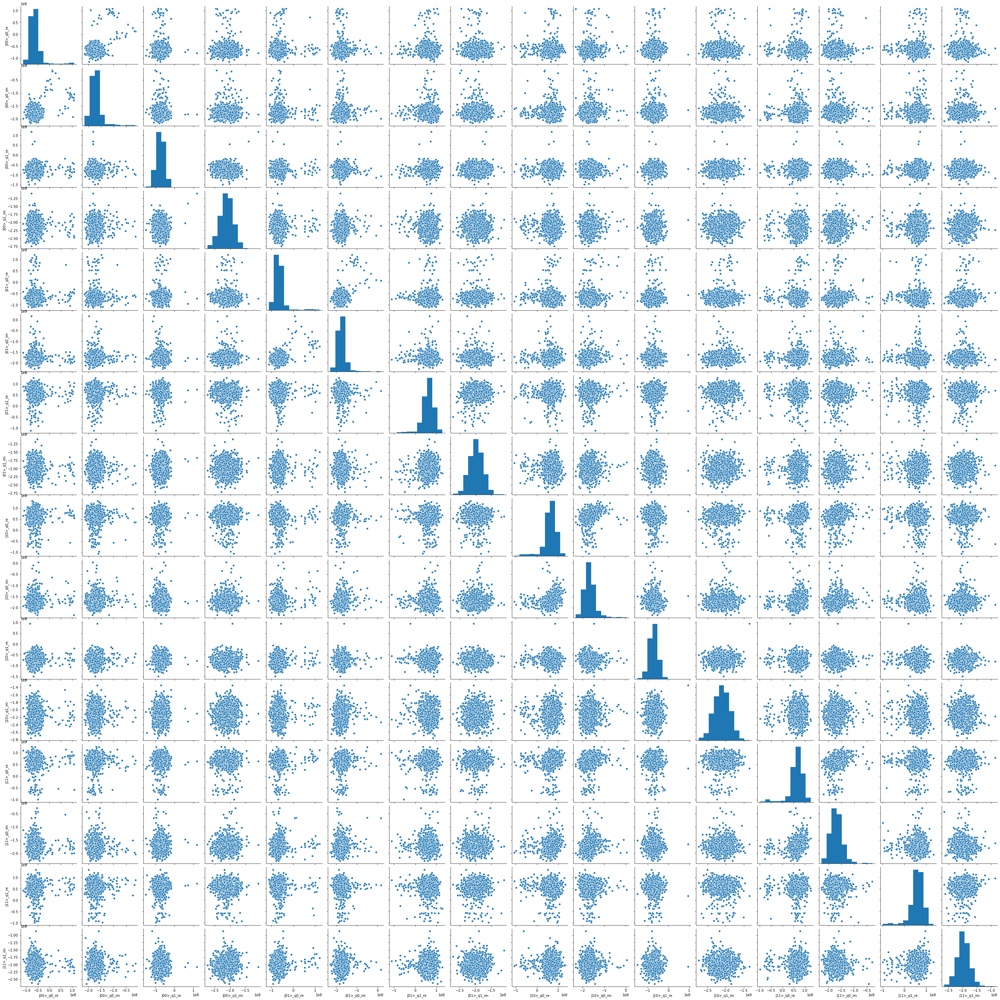

In [60]:
sns.pairplot(total_df)

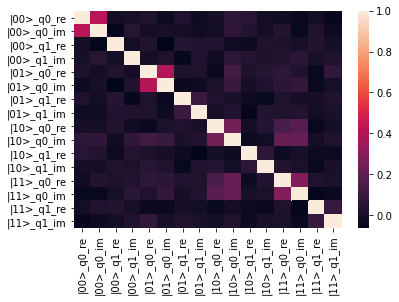

In [61]:
pd_corr = total_df.corr()
sns.heatmap(pd_corr)

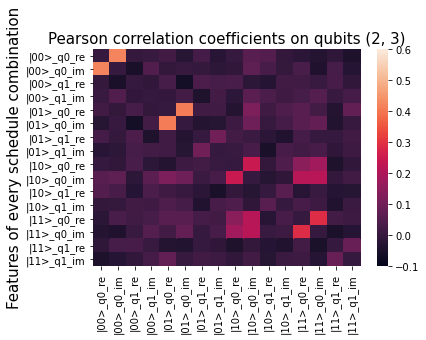

In [62]:
pd_corr = pd.DataFrame(pd_corr.to_numpy()-np.identity(pd_corr.to_numpy().shape[0]), columns=pd_corr.columns, index=pd_corr.index)
heatmap_2_3 = sns.heatmap(pd_corr,vmin = -0.1,vmax = 0.6)
fig = heatmap_2_3.get_figure()
plt.ylabel("Features of every schedule combination", fontsize=15)
plt.title("Pearson correlation coefficients on qubits (2, 3)", fontsize=15)
fig.savefig("heatmap_2_3.png", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_2_3.pdf", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_2_3.svg", transparent = True, bbox_inches = 'tight', pad_inches = 0)

In [63]:
np.corrcoef([data_00_0.values[:,0], data_01_0.values[:,1]])

array([[ 1.        , -0.02647666],
       [-0.02647666,  1.        ]])

In [64]:
np.corrcoef([data_00_0.values[:,1], data_01_0.values[:,0]])

array([[ 1.        , -0.00569998],
       [-0.00569998,  1.        ]])

In [65]:
np.corrcoef([data_10_0.values[:,0], data_11_0.values[:,1]])

array([[1.        , 0.18135766],
       [0.18135766, 1.        ]])

In [66]:
np.corrcoef([data_10_0.values[:,1], data_11_0.values[:,0]])

array([[1.        , 0.21471987],
       [0.21471987, 1.        ]])

In [67]:
np.corrcoef([data_00_1.values[:,0], data_10_1.values[:,1]])

array([[1.        , 0.02239718],
       [0.02239718, 1.        ]])

In [68]:
np.corrcoef([data_00_1.values[:,1], data_10_1.values[:,0]])

array([[1.        , 0.03693728],
       [0.03693728, 1.        ]])

In [69]:
np.corrcoef([data_01_1.values[:,0], data_11_1.values[:,1]])

array([[1.        , 0.02271965],
       [0.02271965, 1.        ]])

In [70]:
np.corrcoef([data_01_1.values[:,1], data_11_1.values[:,0]])

array([[ 1.        , -0.01112592],
       [-0.01112592,  1.        ]])

## Classical model training
The next step is training classical ML model instances for a set of prepared schedules. Two models are trained for each qubit in a qubit coupling, these being |0> and |1> (|00> and |01>) for the 0 qubit, |00>, |01>, |10> and |11> for the 0 qubit, |0> and |1> (|00> and |10>) for the 1 qubit, and |00>, |01>, |10> and |11> for the 1 qubit. These represent the 0_single, 0_both, 1_single and 1_both, respectively.

### Fowlkes Mallows Score

In [71]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.935 (±0.0273) with 10 splits
Train score 0.923 (±0.0037) with 10 splits


In [72]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.936 (±0.0157) with 10 splits
Train score 0.930 (±0.0018) with 10 splits


In [73]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.970 (±0.0091) with 10 splits
Train score 0.964 (±0.0010) with 10 splits


In [74]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.962 (±0.0160) with 10 splits
Train score 0.963 (±0.0018) with 10 splits


### Assignment Fidelity

In [75]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.982 (±0.0065) with 10 splits
Train score 0.980 (±0.0008) with 10 splits


In [76]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.983 (±0.0056) with 10 splits
Train score 0.982 (±0.0006) with 10 splits


In [77]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.992 (±0.0039) with 10 splits
Train score 0.991 (±0.0004) with 10 splits


In [78]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.990 (±0.0032) with 10 splits
Train score 0.991 (±0.0004) with 10 splits


## Classical cross validation correlation analysis

Here we sort assignment fidelities from all four trained classical ML models to observe the differences between scores obtained from qubits trained with single schedules (|00> and |01> with the 0 qubit as the least significant bit) and both schedules (|00>, |01>, |10> and |11>)

### Folkes Mallows train scores

|        | Q2            | Q3            |
|--------|---------------|---------------|
| Single | 0.924 ±0.0026 | 0.964 ±0.0019 |
| Both   | 0.929 ±0.0017 | 0.963 ±0.0014 |

### Folkes Mallows test scores

|        | Q2            | Q3            |
|--------|---------------|---------------|
| Single | 0.926 ±0.0224 | 0.969 ±0.0174 |
| Both   | 0.936 ±0.0158 | 0.963 ±0.0121 |

### Assignment fidelity train scores

|        | Q2            | Q3            |
|--------|---------------|---------------|
| Single | 0.980 ±0.0008 | 0.991 ±0.0004 |
| Both   | 0.982 ±0.0006 | 0.991 ±0.0004 |

### Assignment fidelity test scores

|        | Q2            | Q3            |
|--------|---------------|---------------|
| Single | 0.982 ±0.0065 | 0.992 ±0.0039 |
| Both   | 0.983 ±0.0056 | 0.990 ±0.0032 |

# Qubits 3 and 4

## Dataset retrieval
We first obtain the .csv files with the IQ signal data from applying each combination of the arrays to be used as input for the pearson correlation coefficients. We also plot the data to check if they are as expected.

In [79]:
data_00_0 = pd.read_csv('data/dataset_bogota_3_4_00_0.csv')[['x_1','x_2','y']]
data_00_1 = pd.read_csv('data/dataset_bogota_3_4_00_1.csv')[['x_1','x_2','y']]
data_01_0 = pd.read_csv('data/dataset_bogota_3_4_01_0.csv')[['x_1','x_2','y']]
data_01_1 = pd.read_csv('data/dataset_bogota_3_4_01_1.csv')[['x_1','x_2','y']]
data_10_0 = pd.read_csv('data/dataset_bogota_3_4_10_0.csv')[['x_1','x_2','y']]
data_10_1 = pd.read_csv('data/dataset_bogota_3_4_10_1.csv')[['x_1','x_2','y']]
data_11_0 = pd.read_csv('data/dataset_bogota_3_4_11_0.csv')[['x_1','x_2','y']]
data_11_1 = pd.read_csv('data/dataset_bogota_3_4_11_1.csv')[['x_1','x_2','y']]

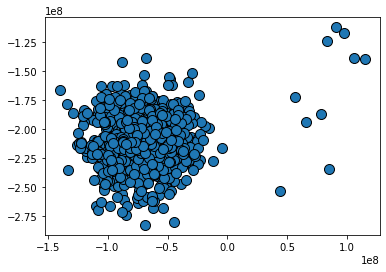

In [80]:
X = data_00_0
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

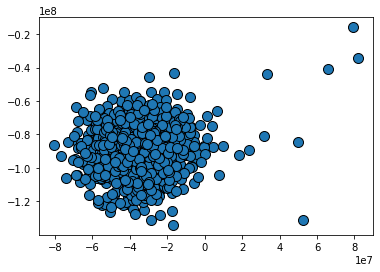

In [81]:
X = data_00_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

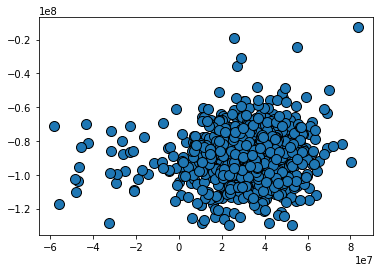

In [82]:
X = data_11_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

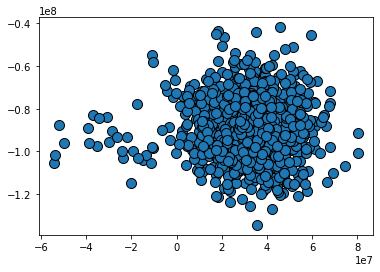

In [83]:
X = data_01_1
mglearn.discrete_scatter(X.iloc[:, 0], X.iloc[:, 1], X.iloc[:, 2])

## Pearson correlation coefficients
We now make pairplots of the data points and find pearson correlation coefficients for all the arrays retrieved from the dataset preparation, resulting in a heatmap and several specific correlation coefficients of interest.

In [84]:
data_00_0_x1 = pd.DataFrame(data_00_0['x_1'])
data_00_0_x2 = pd.DataFrame(data_00_0['x_2'])
data_00_1_x1 = pd.DataFrame(data_00_1['x_1'])
data_00_1_x2 = pd.DataFrame(data_00_1['x_2'])
data_01_0_x1 = pd.DataFrame(data_01_0['x_1'])
data_01_0_x2 = pd.DataFrame(data_01_0['x_2'])
data_01_1_x1 = pd.DataFrame(data_01_1['x_1'])
data_01_1_x2 = pd.DataFrame(data_01_1['x_2'])
data_10_0_x1 = pd.DataFrame(data_10_0['x_1'])
data_10_0_x2 = pd.DataFrame(data_10_0['x_2'])
data_10_1_x1 = pd.DataFrame(data_10_1['x_1'])
data_10_1_x2 = pd.DataFrame(data_10_1['x_2'])
data_11_0_x1 = pd.DataFrame(data_11_0['x_1'])
data_11_0_x2 = pd.DataFrame(data_11_0['x_2'])
data_11_1_x1 =  pd.DataFrame(data_11_1['x_1'])
data_11_1_x2 =  pd.DataFrame(data_11_1['x_2'])
total_df = pd.concat((data_00_0_x1, data_00_0_x2, \
                      data_00_1_x1, data_00_1_x2, \
                      data_01_0_x1, data_01_0_x2, \
                      data_01_1_x1, data_01_1_x2, \
                      data_10_0_x1, data_10_0_x2, \
                      data_10_1_x1, data_10_1_x2, \
                      data_11_0_x1, data_11_0_x2, \
                      data_11_1_x1, data_11_1_x2), axis=1)
total_df.columns = ['|00>_q0_re', '|00>_q0_im', \
                      '|00>_q1_re', '|00>_q1_im', \
                      '|01>_q0_re', '|01>_q0_im', \
                      '|01>_q1_re', '|01>_q1_im', \
                      '|10>_q0_re', '|10>_q0_im', \
                      '|10>_q1_re', '|10>_q1_im', \
                      '|11>_q0_re', '|11>_q0_im', \
                      '|11>_q1_re', '|11>_q1_im']

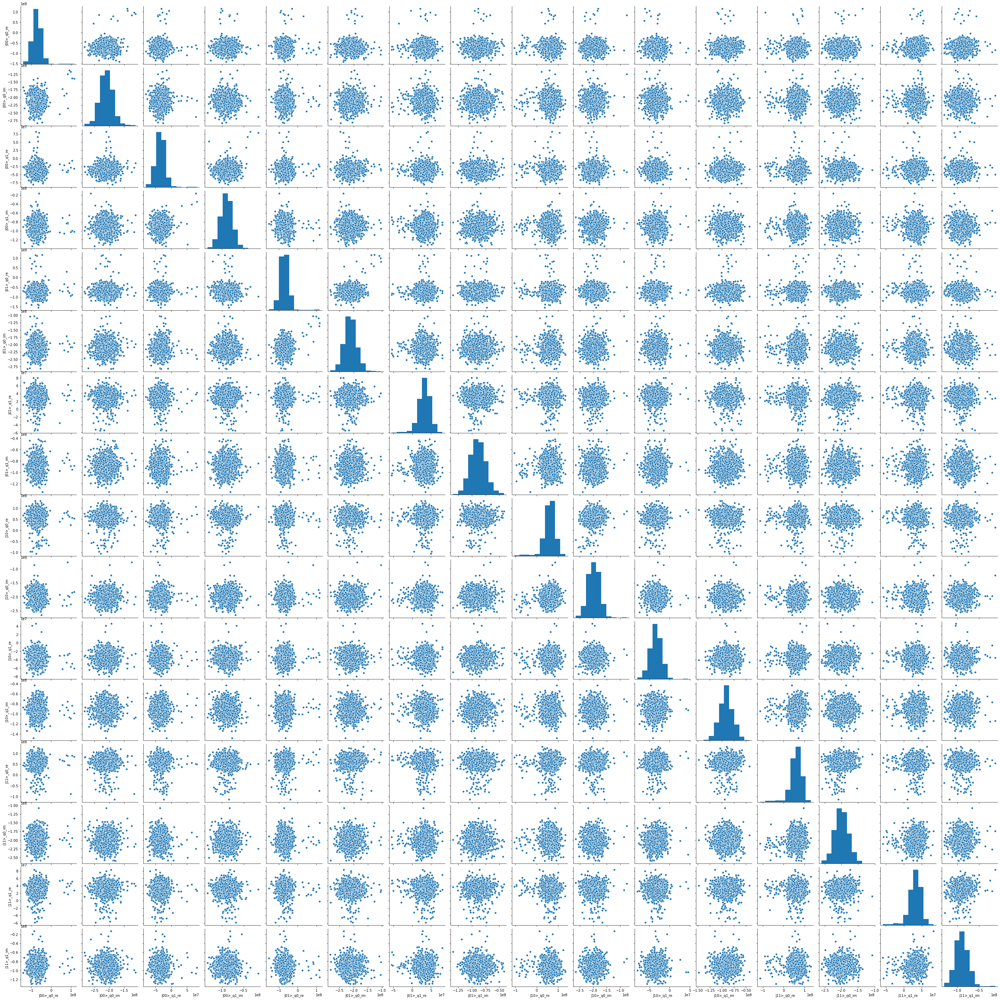

In [85]:
sns.pairplot(total_df)

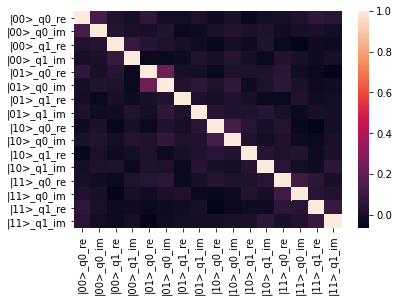

In [86]:
pd_corr = total_df.corr()
sns.heatmap(pd_corr)

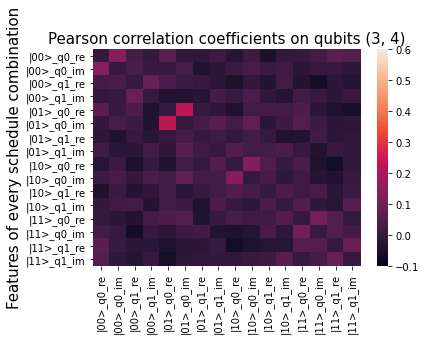

In [87]:
pd_corr = pd.DataFrame(pd_corr.to_numpy()-np.identity(pd_corr.to_numpy().shape[0]), columns=pd_corr.columns, index=pd_corr.index)
heatmap_3_4 = sns.heatmap(pd_corr,vmin = -0.1,vmax = 0.6)
fig = heatmap_3_4.get_figure()
plt.ylabel("Features of every schedule combination", fontsize=15)
plt.title("Pearson correlation coefficients on qubits (3, 4)", fontsize=15)
fig.savefig("heatmap_3_4.png", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_3_4.pdf", transparent = True, bbox_inches = 'tight', pad_inches = 0)
fig.savefig("heatmap_3_4.svg", transparent = True, bbox_inches = 'tight', pad_inches = 0)

In [88]:
np.corrcoef([data_00_0.values[:,0], data_01_0.values[:,1]])

array([[ 1.        , -0.00583333],
       [-0.00583333,  1.        ]])

In [89]:
np.corrcoef([data_00_0.values[:,1], data_01_0.values[:,0]])

array([[1.        , 0.00419115],
       [0.00419115, 1.        ]])

In [90]:
np.corrcoef([data_10_0.values[:,0], data_11_0.values[:,1]])

array([[ 1.        , -0.04336643],
       [-0.04336643,  1.        ]])

In [91]:
np.corrcoef([data_10_0.values[:,1], data_11_0.values[:,0]])

array([[1.        , 0.01661386],
       [0.01661386, 1.        ]])

In [92]:
np.corrcoef([data_00_1.values[:,0], data_10_1.values[:,1]])

array([[1.        , 0.02097895],
       [0.02097895, 1.        ]])

In [93]:
np.corrcoef([data_00_1.values[:,1], data_10_1.values[:,0]])

array([[ 1.        , -0.01021333],
       [-0.01021333,  1.        ]])

In [94]:
np.corrcoef([data_01_1.values[:,0], data_11_1.values[:,1]])

array([[ 1.       , -0.0086243],
       [-0.0086243,  1.       ]])

In [95]:
np.corrcoef([data_01_1.values[:,1], data_11_1.values[:,0]])

array([[1.        , 0.00333647],
       [0.00333647, 1.        ]])

## Classical model training
The next step is training classical ML model instances for a set of prepared schedules. Two models are trained for each qubit in a qubit coupling, these being |0> and |1> (|00> and |01>) for the 0 qubit, |00>, |01>, |10> and |11> for the 0 qubit, |0> and |1> (|00> and |10>) for the 1 qubit, and |00>, |01>, |10> and |11> for the 1 qubit. These represent the 0_single, 0_both, 1_single and 1_both, respectively.

### Fowlkes Mallows Score

In [96]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.961 (±0.0175) with 10 splits
Train score 0.957 (±0.0019) with 10 splits


In [97]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.956 (±0.0093) with 10 splits
Train score 0.954 (±0.0010) with 10 splits


In [98]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.949 (±0.0192) with 10 splits
Train score 0.949 (±0.0020) with 10 splits


In [99]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring='fowlkes_mallows_score', cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.949 (±0.0121) with 10 splits
Train score 0.952 (±0.0014) with 10 splits


### Assignment Fidelity

In [100]:
from sklearn.model_selection import cross_validate, ShuffleSplit
from sklearn.cluster import KMeans

X_0_single = np.concatenate((data_00_0.values[:,:2],data_10_0.values[:,:2]))
y_0_single = np.concatenate((data_00_0.values[:,2],data_10_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_single = cross_validate(km, X_0_single, y_0_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_single)

Test score 0.989 (±0.0037) with 10 splits
Train score 0.989 (±0.0004) with 10 splits


In [101]:
X_0_both = np.concatenate((data_00_0.values[:,:2],data_01_0.values[:,:2],data_10_0.values[:,:2],data_11_0.values[:,:2]))
y_0_both = np.concatenate((data_00_0.values[:,2],data_01_0.values[:,2],data_10_0.values[:,2],data_11_0.values[:,2]))

km = KMeans(n_clusters=2)
z_0_both = cross_validate(km, X_0_both, y_0_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_0_both)

Test score 0.988 (±0.0036) with 10 splits
Train score 0.988 (±0.0004) with 10 splits


In [102]:
X_1_single = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2]))
y_1_single = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_single = cross_validate(km, X_1_single, y_1_single, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_single)

Test score 0.987 (±0.0056) with 10 splits
Train score 0.987 (±0.0006) with 10 splits


In [103]:
X_1_both = np.concatenate((data_00_1.values[:,:2],data_01_1.values[:,:2],data_10_1.values[:,:2],data_11_1.values[:,:2]))
y_1_both = np.concatenate((data_00_1.values[:,2],data_01_1.values[:,2],data_10_1.values[:,2],data_11_1.values[:,2]))

km = KMeans(n_clusters=2)
z_1_both = cross_validate(km, X_1_both, y_1_both, return_train_score=True, return_estimator=True, scoring=assignment_fidelity, cv=ShuffleSplit(n_splits=10, test_size=0.1))

report_cv_score(z_1_both)

Test score 0.988 (±0.0039) with 10 splits
Train score 0.988 (±0.0004) with 10 splits


## Classical cross validation correlation analysis

Here we sort assignment fidelities from all four trained classical ML models to observe the differences between scores obtained from qubits trained with single schedules (|00> and |01> with the 0 qubit as the least significant bit) and both schedules (|00>, |01>, |10> and |11>)

### Folkes Mallows train scores

|        | Q3            | Q4            |
|--------|---------------|---------------|
| Single | 0.958 ±0.0025 | 0.949 ±0.0020 |
| Both   | 0.954 ±0.0015 | 0.952 ±0.0015 |

### Folkes Mallows test scores

|        | Q3            | Q4            |
|--------|---------------|---------------|
| Single | 0.951 ±0.0224 | 0.951 ±0.0189 |
| Both   | 0.953 ±0.0133 | 0.952 ±0.0134 |

### Assignment fidelity train scores

|        | Q3            | Q4            |
|--------|---------------|---------------|
| Single | 0.989 ±0.0004 | 0.987 ±0.0006 |
| Both   | 0.988 ±0.0004 | 0.988 ±0.0004 |

### Assignment fidelity test scores

|        | Q3            | Q4            |
|--------|---------------|---------------|
| Single | 0.989 ±0.0037 | 0.987 ±0.0056 |
| Both   | 0.988 ±0.0036 | 0.988 ±0.0039 |